In [142]:
%load_ext autoreload
%autoreload 2

import re
import joblib
from datetime import datetime
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport

from sklearn.preprocessing import StandardScaler, LabelEncoder

import contractions
from nltk.corpus import stopwords,wordnet
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

pd.set_option('display.float_format', lambda x: '%.2f' % x)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Introduction

The objective of this notebook is to do an EDA. The steps considered are the following:
- Load data set
- Check nulls
- Check duplicates
- Describe basic statistics and size
- Check correlation between variables and with target
- Feature engineering

# Load data set

In [186]:
df_train = pd.read_csv('../data/raw/train.csv')
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 16 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   uid                         10000 non-null  int64  
 1   city                        10000 non-null  object 
 2   description                 10000 non-null  object 
 3   homeType                    10000 non-null  object 
 4   latitude                    10000 non-null  float64
 5   longitude                   10000 non-null  float64
 6   garageSpaces                10000 non-null  int64  
 7   hasSpa                      10000 non-null  bool   
 8   yearBuilt                   10000 non-null  int64  
 9   numOfPatioAndPorchFeatures  10000 non-null  int64  
 10  lotSizeSqFt                 10000 non-null  float64
 11  avgSchoolRating             10000 non-null  float64
 12  MedianStudentsPerTeacher    10000 non-null  int64  
 13  numOfBathrooms              1000

We find 10k entries, 15 fields 

In [5]:
df_train.head()

,uid,city,description,homeType,latitude,longitude,garageSpaces,hasSpa,yearBuilt,numOfPatioAndPorchFeatures,lotSizeSqFt,avgSchoolRating,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,priceRange
0,1748,austin,MULTIPLE OFFERS submit best & final to Agent b...,Single Family,30.38,-97.80,0,False,1988,0,102366.00,7.00,17,4.00,4,650000+
1,13380,austin,"4644 Hoffman Dr, Austin, TX 78749 is a single ...",Single Family,30.20,-97.86,0,False,1997,0,6534.00,6.67,16,3.00,4,350000-450000
2,4115,austin,"6804 Canal St, Austin, TX 78741 is a single fa...",Single Family,30.23,-97.70,0,False,1952,0,5619.00,3.33,11,1.00,2,0-250000
3,6926,austin,Beautiful large lot with established trees. Lo...,Single Family,30.21,-97.79,4,False,1976,0,6416.00,4.00,14,2.00,4,0-250000
4,14480,austin,Stunning NW Hills designer remodel by Cedar an...,Single Family,30.35,-97.77,2,False,1984,0,10759.00,7.00,16,3.00,5,650000+


# Check nulls

In [6]:
# replace empty strings with None
df_train = df_train.replace('', None)

In [7]:
print(f'There are {df_train.isnull().sum().sum()} nulls in data set')

There are 0 nulls in data set


# Check duplicates

In [8]:
print(f'There are {df_train[df_train.duplicated()].shape[0]} duplicates')

There are 0 duplicates


# Describe, visualize and check correlation

In [9]:
df_train.describe()

,uid,latitude,longitude,garageSpaces,yearBuilt,numOfPatioAndPorchFeatures,lotSizeSqFt,avgSchoolRating,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms
count,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00,10000.00
mean,7626.62,30.29,-97.78,1.23,1988.57,0.67,20710.28,5.77,14.86,2.69,3.45
std,4380.49,0.10,0.08,1.33,21.52,0.99,448833.82,1.86,1.75,0.98,0.81
min,1.00,30.09,-98.02,0.00,1905.00,0.00,100.00,2.33,10.00,1.00,1.00
25%,3838.75,30.20,-97.84,0.00,1975.00,0.00,6534.00,4.00,14.00,2.00,3.00
50%,7603.50,30.28,-97.77,1.00,1993.00,0.00,8189.00,5.67,15.00,3.00,3.00
75%,11435.75,30.37,-97.72,2.00,2006.00,1.00,10890.00,7.00,16.00,3.00,4.00
max,15170.00,30.52,-97.57,22.00,2020.00,8.00,34154524.80,9.50,19.00,10.00,10.00


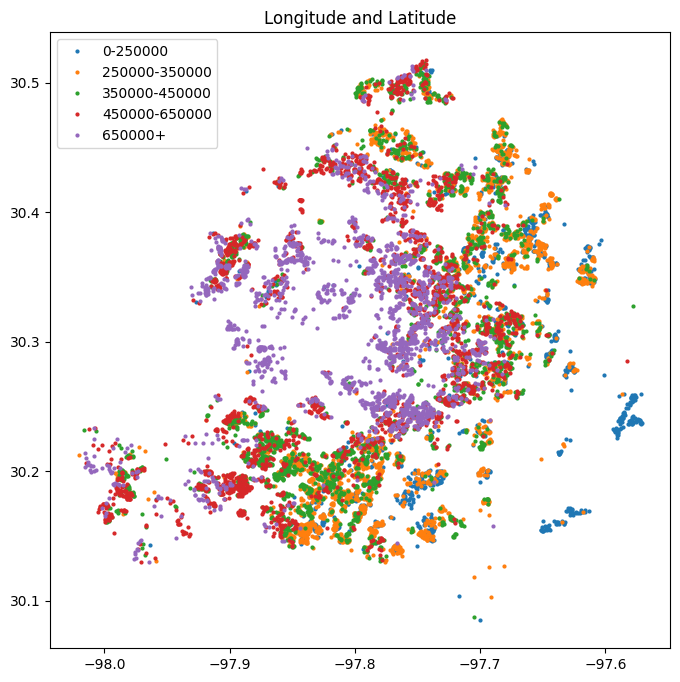

In [199]:
# visualize latitude and longitud by price range
groups = df_train.groupby('priceRange')
fig, ax = plt.subplots(figsize=(8, 8))
for name, group in groups:
    plt.plot(group.longitude, group.latitude, marker='o', linestyle='', markersize=2, label=name)
plt.title('Longitude and Latitude')
plt.legend();

It seems like for different price ranges, houses are located in a dense areas. For example, lower prices are in the surroundings, but higher prices are in the center. This indicates these two fields might be good features 

In [11]:
# use profiler to quickly have ingights from the data
profile = ProfileReport(df_train, title="EDA")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

From the profiling report, there are many insights to highlight in the data:
- description has a high cardinality. **We'll handle this differently since we can extract some features from here**
- longitude is highly overall correlated with avgSchoolRating and MedianStudentsPerTeacher. 
- avgSchoolRating is highly overall correlated with MedianStudentsPerTeacher. 
- numOfBedrooms is highly overall correlated with numOfBathrooms. 
- city is highly imbalanced (96.5%). 
- homeType is highly imbalanced (87.2%). 
- hasSpa is highly imbalanced (58.9%). 
- lotSizeSqFt is highly skewed. 
- uid has many unique values. **We'll remove it**
- garageSpaces has 4458 (44.6%). 
- numOfPatioAndPorchFeatures has 6072 (60.7%). 
- **There are no strong enough correlation between label and independet variables**

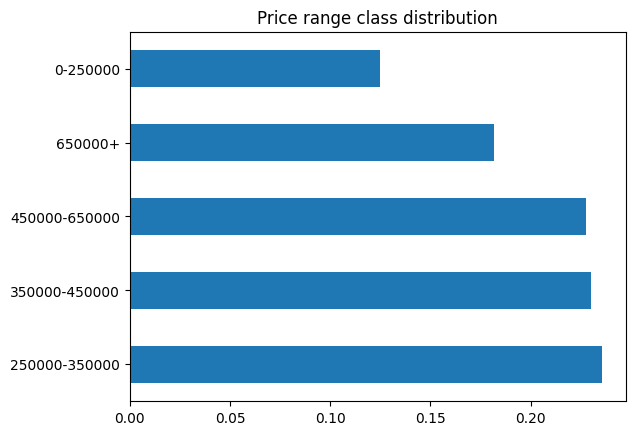

In [12]:
# visualize label distribution
df_train.priceRange.value_counts(normalize=True).plot(kind='barh')
plt.title('Price range class distribution');

We can see is quite balanced. We'll not apply any over/under sampling technique.

In [200]:
# removing uid
df_train_clean = df_train.drop(columns=['uid'])
df_train_clean.head()

,city,description,homeType,latitude,longitude,garageSpaces,hasSpa,yearBuilt,numOfPatioAndPorchFeatures,lotSizeSqFt,avgSchoolRating,MedianStudentsPerTeacher,numOfBathrooms,numOfBedrooms,priceRange
0,austin,MULTIPLE OFFERS submit best & final to Agent b...,Single Family,30.38,-97.80,0,False,1988,0,102366.00,7.00,17,4.00,4,650000+
1,austin,"4644 Hoffman Dr, Austin, TX 78749 is a single ...",Single Family,30.20,-97.86,0,False,1997,0,6534.00,6.67,16,3.00,4,350000-450000
2,austin,"6804 Canal St, Austin, TX 78741 is a single fa...",Single Family,30.23,-97.70,0,False,1952,0,5619.00,3.33,11,1.00,2,0-250000
3,austin,Beautiful large lot with established trees. Lo...,Single Family,30.21,-97.79,4,False,1976,0,6416.00,4.00,14,2.00,4,0-250000
4,austin,Stunning NW Hills designer remodel by Cedar an...,Single Family,30.35,-97.77,2,False,1984,0,10759.00,7.00,16,3.00,5,650000+


In [201]:
df_train_clean.to_parquet('../data/interim/train_clean-v2-features_selected_from_correlation.gzip',compression='gzip')

# Feature engineering

In [202]:
df_train_clean = pd.read_parquet('../data/interim/train_clean-v2-features_selected_from_correlation.gzip')

## One hot nominal variables

In [203]:
nominal_variables = ['city','homeType']
nominal_features = pd.get_dummies(df_train_clean[nominal_variables])
nominal_features.head()

,city_austin,city_del valle,city_driftwood,city_dripping springs,city_manchaca,city_pflugerville,city_west lake hills,homeType_Apartment,homeType_Condo,homeType_Mobile / Manufactured,homeType_MultiFamily,homeType_Multiple Occupancy,homeType_Other,homeType_Residential,homeType_Single Family,homeType_Townhouse,homeType_Vacant Land
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


## Transform yearBuilt to yearOld and select numerical features

In [204]:
df_train_clean['yearOld'] = datetime.now().year - df_train_clean['yearBuilt']
df_train_clean.yearOld.describe()

count   10000.00
mean       34.43
std        21.52
min         3.00
25%        17.00
50%        30.00
75%        48.00
max       118.00
Name: yearOld, dtype: float64

In [205]:
df_train_clean.drop(columns=['yearBuilt'], inplace=True)

In [206]:
df_train_clean.columns

Index(['city', 'description', 'homeType', 'latitude', 'longitude',
       'garageSpaces', 'hasSpa', 'numOfPatioAndPorchFeatures', 'lotSizeSqFt',
       'avgSchoolRating', 'MedianStudentsPerTeacher', 'numOfBathrooms',
       'numOfBedrooms', 'priceRange', 'yearOld'],
      dtype='object')

In [207]:
numeric_features = df_train_clean.select_dtypes(include=np.number)
numeric_features['hasSpa'] = df_train_clean.hasSpa.astype(int)

## N-Gram analysis

In [210]:
def preprocess_text(lemmatizer, stopwords, text):
  new_text = []

  for word in text.split():
    expanded_word = contractions.fix(word)
    lemmatized_word = lemmatizer.lemmatize(word)
    new_text.append(lemmatized_word)

  new_text = ' '.join(new_text)
  alphabetic_words =  re.sub(r"[^a-zA-Z-:]+", ' ', new_text)
  lowercased_words = alphabetic_words.lower()

  # remove stop words
  preprocessed_text = []
  for word in lowercased_words.split():
    if word not in stopwords:
      preprocessed_text.append(word)

  return ' '.join(preprocessed_text)


lemmatizer = WordNetLemmatizer()
stopwords_list = stopwords.words('english') + ['austin', 'contains', 'sq', 'ft', 'tx', 'w', 'ah', 'wa', 'dr', 'st', 'ha', 'ln']

df_train_clean['description_preprocessed'] = df_train_clean.description.apply(lambda x: preprocess_text(lemmatizer, stopwords_list, x))

In [212]:
def generate_ngrams(text, n_gram=1):
        token = text.split()
        ngrams = zip(*[token[i:] for i in range(n_gram)])
        return [" ".join(ngram) for ngram in ngrams]

def ngram_analysis(ngram_number,df,text_column,number_top_words=20):
    # Get the bar chart from dataset
    output = []
    for n in range(1,ngram_number+1):
        freq_dict = defaultdict(int)
        for text in df[text_column]:
            for ngram in generate_ngrams(text,n):
                freq_dict[ngram] += 1
        fd_sorted = pd.DataFrame(sorted(freq_dict.items(), key=lambda x: x[1])[::-1])
        fd_sorted.columns = ['n-word', 'wordcount']
        
        best_fd_sorted = fd_sorted.head(number_top_words)
        output.append(best_fd_sorted)
    return pd.concat(output).reset_index(drop=True)

In [213]:
kw_distrib_highrange = ngram_analysis(2,df_train_clean[df_train_clean.priceRange == '650000+'],'description_preprocessed',number_top_words=20)

In [214]:
kw_distrib_midrange = ngram_analysis(2,df_train_clean[df_train_clean.priceRange == '450000-650000'],'description_preprocessed',number_top_words=20)

In [215]:
kw_distrib_lowrange = ngram_analysis(2,df_train_clean[df_train_clean.priceRange == '0-250000'],'description_preprocessed',number_top_words=20)

In [216]:
kw_distrib_highrange['range'] = 'high'
kw_distrib_midrange['range'] = 'mid'
kw_distrib_lowrange['range'] = 'low'

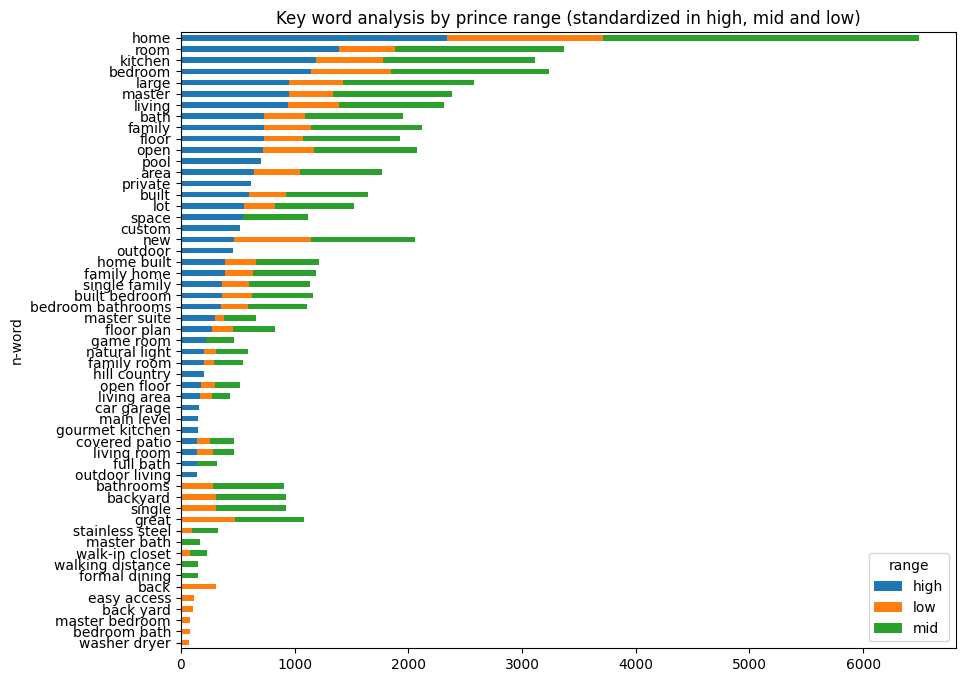

In [217]:
kw_concatenation = pd.concat([kw_distrib_highrange, kw_distrib_midrange, kw_distrib_lowrange])
kw_by_ranges = kw_concatenation.pivot(index='n-word',columns='range',values='wordcount').fillna(0).sort_values(['high','mid','low'],ascending=True)
kw_by_ranges.plot(kind='barh', stacked=True, figsize=(10,8))
plt.title('Key word analysis by prince range (standardized in high, mid and low)');

Considering these key words for different price ranges, we'll choose the following and add them to the data set as features:
- backyard or back yard
- car garage
- stainless steel
- walk-in closet
- easy access
- gourmet kitchen
- game room
- master suite
- outdoor
- pool

In [218]:
text_features = df_train_clean[['description','description_preprocessed']].copy()

In [219]:
text_features['backyard'] = text_features.description_preprocessed.apply(lambda x: True if any(word in x for word in ['backyard', 'back yard']) else False)
text_features['cargarage'] = text_features.description_preprocessed.str.contains('car garage')
text_features['stainlesssteel'] = text_features.description_preprocessed.str.contains('stainless steel')
text_features['walkincloset'] = text_features.description_preprocessed.str.contains('walk-in closet')
text_features['easyaccess'] = text_features.description_preprocessed.str.contains('easy access')
text_features['gourmetkitchen'] = text_features.description_preprocessed.str.contains('gourmet kitchen')
text_features['gameroom'] = text_features.description_preprocessed.str.contains('game room')
text_features['mastersuite'] = text_features.description_preprocessed.str.contains('master suite')
text_features['outdoor'] = text_features.description_preprocessed.str.contains('outdoor')
text_features['pool'] = text_features.description_preprocessed.str.contains('pool')

text_features.head()

,description,description_preprocessed,backyard,cargarage,stainlesssteel,walkincloset,easyaccess,gourmetkitchen,gameroom,mastersuite,outdoor,pool
0,MULTIPLE OFFERS submit best & final to Agent b...,multiple offers submit best final agent mon - ...,False,True,False,True,False,False,False,True,False,True
1,"4644 Hoffman Dr, Austin, TX 78749 is a single ...",hoffman single family home built bedroom bathr...,False,False,False,False,False,False,False,False,False,False
2,"6804 Canal St, Austin, TX 78741 is a single fa...",canal single family home built bedroom bathroom,False,False,False,False,False,False,False,False,False,False
3,Beautiful large lot with established trees. Lo...,beautiful large lot established trees lovely l...,True,False,False,False,False,False,False,False,False,False
4,Stunning NW Hills designer remodel by Cedar an...,stunning nw hills designer remodel cedar oak h...,False,False,False,False,False,False,False,False,False,False


In [220]:
text_features.drop(columns=['description','description_preprocessed'], inplace=True)

In [221]:
text_features = text_features.astype(int)

## Standardize features

In [253]:
features = nominal_features.join(numeric_features).join(text_features)
features.head()

,city_austin,city_del valle,city_driftwood,city_dripping springs,city_manchaca,city_pflugerville,city_west lake hills,homeType_Apartment,homeType_Condo,homeType_Mobile / Manufactured,...,backyard,cargarage,stainlesssteel,walkincloset,easyaccess,gourmetkitchen,gameroom,mastersuite,outdoor,pool
0,1,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,1
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [223]:
# scaler= StandardScaler()
# standardized_features = scaler.fit_transform(features)

# Set X and Y

In [224]:
le = LabelEncoder()
y = le.fit_transform(df_train_clean.priceRange)
y = pd.DataFrame(y, columns=['label'])
y

,label
0,4
1,2
2,0
3,0
4,4
...,...
9995,4
9996,1
9997,2
9998,1


In [254]:
X = features
X

,city_austin,city_del valle,city_driftwood,city_dripping springs,city_manchaca,city_pflugerville,city_west lake hills,homeType_Apartment,homeType_Condo,homeType_Mobile / Manufactured,...,backyard,cargarage,stainlesssteel,walkincloset,easyaccess,gourmetkitchen,gameroom,mastersuite,outdoor,pool
0,1,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,1
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,1
9996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
9997,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


# Feature importance

We'll get the feature importance using the Random Forest model

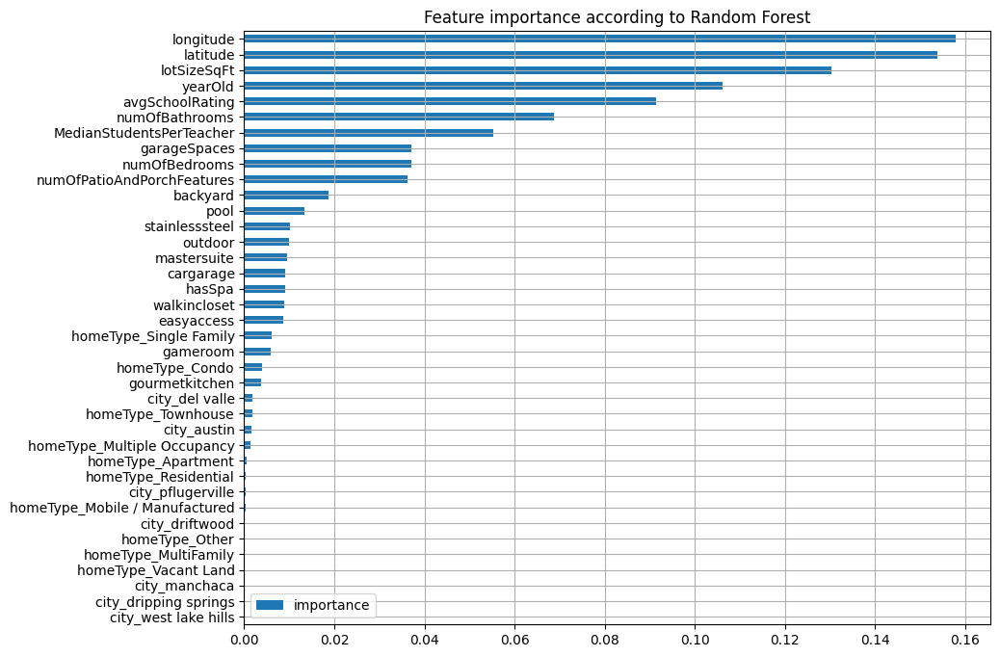

In [255]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators = 100, random_state = 18, class_weight='balanced')
rf.fit(X, y.values.ravel())

feature_importance = pd.DataFrame(rf.feature_importances_, index=X.columns, columns=['importance'])
feature_importance.sort_values(['importance']).plot(kind='barh', figsize=(10,8))
plt.title('Feature importance according to Random Forest')
plt.grid();

In [256]:
# choosing threshold of 0.01
feature_importance[feature_importance.importance >= 0.02].sort_values('importance')

,importance
numOfPatioAndPorchFeatures,0.04
numOfBedrooms,0.04
garageSpaces,0.04
MedianStudentsPerTeacher,0.06
numOfBathrooms,0.07
avgSchoolRating,0.09
yearOld,0.11
lotSizeSqFt,0.13
latitude,0.15
longitude,0.16


In [257]:
# select most important features
X = X[feature_importance[feature_importance.importance >= 0.02].index.values].copy()

# Save X, y, scaler and label encoder

In [258]:
X.to_parquet('../data/processed/X_train.gzip',compression='gzip')

In [259]:
y.to_parquet('../data/processed/y_train.gzip',compression='gzip')

In [251]:
joblib.dump(le,'../models/label_encoder.bin')

['../models/label_encoder-v2.bin']

In [260]:
joblib.dump(X.columns,'../data/processed/important_features.bin')

['../data/processed/important_features-v2.bin']